# Autoscout Price Prediction Deployment

# Libraries

In [ ]:
# !pip install xgboost

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from scipy.stats import skew

from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder,StandardScaler,PowerTransformer, MinMaxScaler, RobustScaler
from sklearn.model_selection import KFold, cross_val_predict, train_test_split,GridSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge,ElasticNet
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.feature_selection import SelectKBest,SelectPercentile,f_classif,f_regression,mutual_info_regression
from xgboost import XGBRegressor
from xgboost import plot_importance


#importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import warnings
warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

from sklearn.compose import make_column_transformer

# Scaling
from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler


# Importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Figure&Display options
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# !pip install termcolor
import colorama
from colorama import Fore, Style  # maakes strings colored
from termcolor import colored

import ipywidgets
from ipywidgets import interact

In [5]:
## Some Useful Functions

###############################################################################

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number']>0]

###############################################################################

def first_looking(df):
    print(colored("Shape:", attrs=['bold']), df.shape,'\n', 
          colored('-'*79, 'red', attrs=['bold']),
          colored("\nInfo:\n", attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", attrs=['bold']), df.nunique(),'\n',
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", attrs=['bold']), missing_values(df),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", attrs=['bold']), list(df.columns),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

    print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    
        
def multicolinearity_control(df):
    feature =[]
    collinear=[]
    for col in df.corr().columns:
        for i in df.corr().index:
            if (abs(df.corr()[col][i])> .9 and abs(df.corr()[col][i]) < 1):
                    feature.append(col)
                    collinear.append(i)
                    print(colored(f"Multicolinearity alert in between:{col} - {i}", 
                                  "red", attrs=['bold']), df.shape,'\n',
                                  colored('-'*79, 'red', attrs=['bold']), sep='')

def duplicate_values(df):
    print(colored("Duplicate check...", attrs=['bold']), sep='')
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored("Duplicates were dropped!"),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    else:
        print(colored("There are no duplicates"),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')     
        
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
        print(drop_columns, 'were dropped')
    else:
        print(colored('We will now check the missing values and if necessary will drop realted columns!', attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_null(df, limit):
    print('Shape:', df.shape)
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)
            print('new shape:', df.shape)       
    print('New shape after missing value control:', df.shape)
    
###############################################################################

# Data Gathering

In [6]:
df0 = pd.read_csv("autoscoutpart_3_before_dummy(prev_owner).csv")
df = df0.copy()
df.head()
first_looking(df)
duplicate_values(df)
drop_columns(df,[])
drop_null(df, 90)
# df.head()
# df.describe().T
# df.describe(include=object).T

Shape:(15919, 32)
-------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15919 entries, 0 to 15918
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           15919 non-null  object 
 1   body_type            15919 non-null  object 
 2   price                15919 non-null  float64
 3   vat                  15919 non-null  object 
 4   km                   15919 non-null  float64
 5   prev_owner           15919 non-null  float64
 6   inspection_new       15919 non-null  object 
 7   body_color           15919 non-null  object 
 8   paint_type           15919 non-null  object 
 9   nr._of_doors         15919 non-null  float64
 10  nr._of_seats         15919 non-null  float64
 11  gearing_type         15919 non-null  object 
 12  cylinders            15919 non-null  float64
 13  drive_chain          15919 non-

# Data Preparation

In [8]:
df.head(2).T

,0,1
make_model,Audi A1,Audi A1
body_type,Sedans,Sedans
price,15770.000,14500.000
vat,YES deduction/negotiation,YES deduction/negotiation
km,56013.000,80000.000
prev_owner,2.000,1.000
inspection_new,Yes,No
body_color,Black,Red
paint_type,Metallic,Metallic
nr._of_doors,5.000,3.000


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,14409.000,18127.984,7421.634,4950.000,12950.000,16970.000,21900.000,74600.000
km,14409.000,32091.129,36777.326,0.000,3000.000,20490.000,46000.000,317000.000
prev_owner,14409.000,1.044,0.328,0.000,1.000,1.000,1.000,4.000
nr._of_doors,14409.000,4.659,0.641,2.000,4.000,5.000,5.000,5.000
nr._of_seats,14409.000,4.944,0.472,2.000,5.000,5.000,5.000,7.000
cylinders,14409.000,3.784,0.415,3.000,4.000,4.000,4.000,5.000
co2_emission,14409.000,118.147,17.058,91.000,105.000,117.000,128.000,189.000
emission_label,14409.000,3.931,0.453,1.000,4.000,4.000,4.000,5.000
gears,14409.000,5.948,0.727,5.000,5.000,6.000,6.000,9.000
age,14409.000,1.394,1.113,0.000,0.000,1.000,2.000,3.000


In [11]:
df.select_dtypes(include ="object").head(3).T

,0,1,2
make_model,Audi A1,Audi A1,Audi A1
body_type,Sedans,Sedans,Sedans
vat,YES deduction/negotiation,YES deduction/negotiation,YES deduction/negotiation
inspection_new,Yes,No,Yes
body_color,Black,Red,Black
paint_type,Metallic,Metallic,Metallic
gearing_type,Automatic,Automatic,Automatic
drive_chain,front,front,front
fuel,Diesel,Benzin,Diesel
emission_class,Euro 6,Euro 6,Euro 6


In [12]:
df.describe(include=object).T

,count,unique,top,freq
make_model,14409,9,Audi A3,2808
body_type,14409,9,Sedans,7222
vat,14409,2,YES deduction/negotiation,10402
inspection_new,14409,2,Yes,11663
body_color,14409,15,Black,3601
paint_type,14409,3,Metallic,14018
gearing_type,14409,3,Manual,7325
drive_chain,14409,2,front,14186
fuel,14409,5,Benzin,7725
emission_class,14409,3,Euro 6,14289


In [13]:
# Numeric ve Categoric sütunların tespiti kapsamında kullanılacak.

numerical= df.drop(['price'], axis=1).select_dtypes('number').columns
categorical = df.select_dtypes('object').columns

print(f'Numerical Columns:  {df[numerical].columns}')
print('\n')
print(f'Categorical Columns: {df[categorical].columns}')

Numerical Columns:  Index(['km', 'prev_owner', 'nr._of_doors', 'nr._of_seats', 'cylinders',
       'co2_emission', 'emission_label', 'gears', 'age', 'hp_kw',
       'displacement_cc', 'weight_kg', 'cons_comb_l/100_km'],
      dtype='object')


Categorical Columns: Index(['make_model', 'body_type', 'vat', 'inspection_new', 'body_color',
       'paint_type', 'gearing_type', 'drive_chain', 'fuel', 'emission_class',
       'comfort_convenience', 'entertainment_media', 'extras',
       'safety_security', 'vehicle_condition', 'warranty_month',
       'upholstery_type', 'upholstery_color'],
      dtype='object')


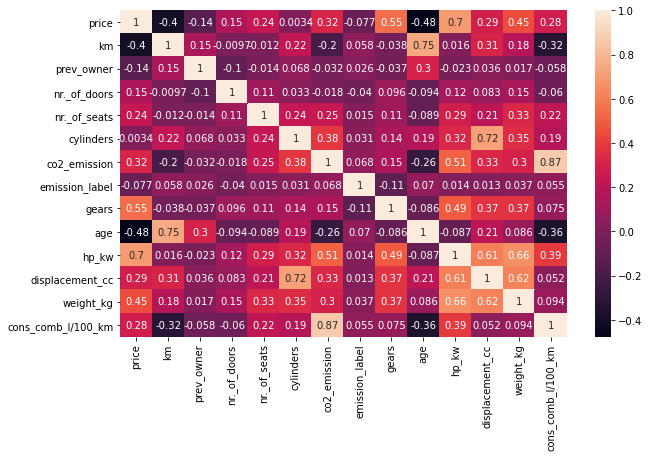

In [19]:
sns.heatmap(df.corr(), annot=True);

# The Examination of Target Variable

In [21]:
df['price'].describe()

count   14409.000
mean    18127.984
std      7421.634
min      4950.000
25%     12950.000
50%     16970.000
75%     21900.000
max     74600.000
Name: price, dtype: float64

## Numerical Features

- Let's see the numerical features

In [25]:
df[numerical].describe()

,km,prev_owner,nr._of_doors,nr._of_seats,cylinders,co2_emission,emission_label,gears,age,hp_kw,displacement_cc,weight_kg,cons_comb_l/100_km
count,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000
mean,32091.129,1.044,4.659,4.944,3.784,118.147,3.931,5.948,1.394,88.611,1429.187,1346.566,4.830
std,36777.326,0.328,0.641,0.472,0.415,17.058,0.453,0.727,1.113,26.541,279.155,209.509,0.927
min,0.000,0.000,2.000,2.000,3.000,91.000,1.000,5.000,0.000,40.000,890.000,840.000,3.000
25%,3000.000,1.000,4.000,5.000,4.000,105.000,4.000,5.000,0.000,66.000,1229.000,1165.000,4.100
50%,20490.000,1.000,5.000,5.000,4.000,117.000,4.000,6.000,1.000,85.000,1461.000,1300.000,4.800
75%,46000.000,1.000,5.000,5.000,4.000,128.000,4.000,6.000,2.000,103.000,1598.000,1472.000,5.400
max,317000.000,4.000,5.000,7.000,5.000,189.000,5.000,9.000,3.000,294.000,2967.000,2471.000,13.800


Several features have gaussian-normal like ditsribution.
I have also observed skewness.
I'll look those in details.

In [27]:
for i in df_numeric:
    print(f"{i:<16}:  {skew(df[i]):.3f}")

# inClass

price           :  1.259
km              :  1.670
prev_owner      :  1.279
nr._of_doors    :  -1.976
nr._of_seats    :  -0.475
cylinders       :  -1.314
co2_emission    :  0.882
emission_label  :  -6.292
gears           :  0.413
age             :  0.183
hp_kw           :  1.335
displacement_cc :  -0.064
weight_kg       :  1.039
cons_comb_l/100_km:  0.871


In [28]:
skew_limit = 0.75 # This is our threshold-limit to evaluate skewness. Overall below abs(1) seems acceptable for the linear models. 
skew_vals = df[numerical].skew()
skew_cols= skew_vals[abs(skew_vals)> skew_limit].sort_values(ascending=False)
skew_cols

km                    1.670
hp_kw                 1.335
prev_owner            1.279
weight_kg             1.039
co2_emission          0.882
cons_comb_l/100_km    0.871
cylinders            -1.315
nr._of_doors         -1.976
emission_label       -6.292
dtype: float64

In [29]:
df[skew_cols.index].iplot(kind='hist');

In [30]:
df[skew_cols.index].iplot(kind='histogram',subplots=True,bins=50)

- Since this is a beginner friendly notebook, let's see several options in the practice without touching our main dataset.
- First I'll show np.log method.
- Then I'll use transformation methods.

### With np.log

In [31]:
df_try = df.copy()

for col in skew_cols.index.values:
    df_try[col] = df_try[col].apply(np.log1p)

print(df_try[skew_cols.index].skew())
print()

df_try[skew_cols.index].iplot(kind='histogram',subplots=True,bins=50);

km                   -1.445
hp_kw                 0.257
prev_owner           -1.205
weight_kg             0.677
co2_emission          0.506
cons_comb_l/100_km    0.254
cylinders            -1.335
nr._of_doors         -2.416
emission_label       -6.318
dtype: float64



### With Power Transformer

In [32]:
df_trans = df[skew_cols.index].copy()
pt = PowerTransformer(method='yeo-johnson')
trans= pt.fit_transform(df_trans)
df_trans = pd.DataFrame(trans, columns =skew_cols.index )
print(df_trans.skew())
print()
df_trans.iplot(kind='histogram',subplots=True,bins=50);

km                   -0.340
hp_kw                 0.011
prev_owner            0.253
weight_kg             0.091
co2_emission          0.052
cons_comb_l/100_km    0.006
cylinders             0.579
nr._of_doors         -1.099
emission_label        6.455
dtype: float64



- During the modelling process, we can use power transformer.

- Let's observe the correlation among the numerical features
- And also observe the correlation with the target variable

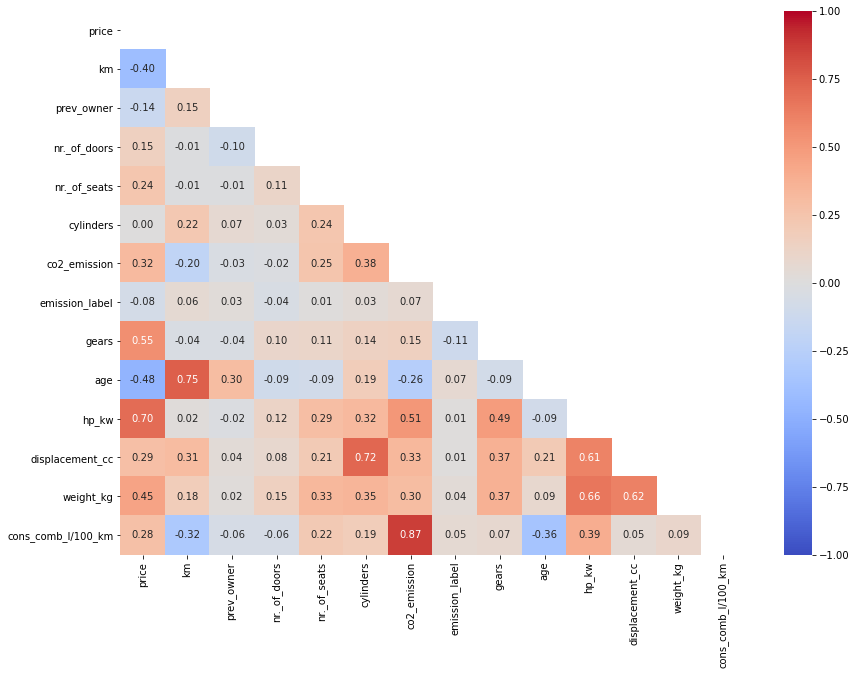

In [33]:
numerical1= df.select_dtypes('number').columns

matrix = np.triu(df[numerical1].corr())
fig, ax = plt.subplots(figsize=(14,10)) 
sns.heatmap (df[numerical1].corr(), annot=True, fmt= '.2f', vmin=-1, vmax=1, center=0, cmap='coolwarm',mask=matrix, ax=ax);

- We have 9 numerical features which have more than .5 correlation with the price variable.
- Which is a good sign for the prediction capability of the model, but still we need to see in the practice.
- From the threshold .9 perspective: Highwaympg and citympg has .97 correlation. We can drop one of them to avoid multicollinearity problems for the linear models.
- I have observed several highly correlated features below the .9 level.

## Categorical Features

In [34]:
df[categorical].head().T

,0,1,2,3,4
make_model,Audi A1,Audi A1,Audi A1,Audi A1,Audi A1
body_type,Sedans,Sedans,Sedans,Sedans,Sedans
vat,YES deduction/negotiation,YES deduction/negotiation,YES deduction/negotiation,NO deduction/negotiation,NO deduction/negotiation
inspection_new,Yes,No,Yes,Yes,Yes
body_color,Black,Red,Black,Brown,Black
paint_type,Metallic,Metallic,Metallic,Metallic,Metallic
gearing_type,Automatic,Automatic,Automatic,Automatic,Automatic
drive_chain,front,front,front,front,front
fuel,Diesel,Benzin,Diesel,Diesel,Diesel
emission_class,Euro 6,Euro 6,Euro 6,Euro 6,Euro 6


# Get Dummies

In [37]:
categorical

Index(['make_model', 'body_type', 'vat', 'inspection_new', 'body_color',
       'paint_type', 'gearing_type', 'drive_chain', 'fuel', 'emission_class',
       'comfort_convenience', 'entertainment_media', 'extras',
       'safety_security', 'vehicle_condition', 'warranty_month',
       'upholstery_type', 'upholstery_color'],
      dtype='object')

In [40]:
df = df.join(df["comfort_convenience"].str.get_dummies(sep = ",").add_prefix("coco_"))
df = df.join(df["entertainment_media"].str.get_dummies(sep = ",").add_prefix("entmedia_"))
df = df.join(df["extras"].str.get_dummies(sep = ",").add_prefix("extrs_"))
df = df.join(df["safety_security"].str.get_dummies(sep = ",").add_prefix("safesec_"))

In [41]:
df.shape

(14409, 126)

In [42]:
df.drop(["comfort_convenience","entertainment_media","extras","safety_security"], axis=1, inplace=True)

In [43]:
df.shape

(14409, 122)

In [48]:
df.head(2)

,make_model,body_type,price,vat,km,prev_owner,inspection_new,body_color,paint_type,nr._of_doors,nr._of_seats,gearing_type,cylinders,drive_chain,fuel,co2_emission,emission_class,emission_label,gears,age,hp_kw,vehicle_condition,warranty_month,upholstery_type,upholstery_color,displacement_cc,weight_kg,cons_comb_l/100_km,coco_Air conditioning,coco_Air suspension,coco_Armrest,coco_Automatic climate control,coco_Auxiliary heating,coco_Cruise control,coco_Electric Starter,coco_Electric tailgate,coco_Electrical side mirrors,coco_Electrically adjustable seats,coco_Electrically heated windshield,coco_Heads-up display,coco_Heated steering wheel,coco_Hill Holder,coco_Keyless central door lock,coco_Leather seats,coco_Leather steering wheel,coco_Light sensor,coco_Lumbar support,coco_Massage seats,coco_Multi-function steering wheel,coco_Navigation system,coco_Panorama roof,coco_Park Distance Control,coco_Parking assist system camera,coco_Parking assist system self-steering,coco_Parking assist system sensors front,coco_Parking assist system sensors rear,coco_Power windows,coco_Rain sensor,coco_Seat heating,coco_Seat ventilation,coco_Split rear seats,coco_Start-stop system,coco_Sunroof,coco_Tinted windows,coco_Wind deflector,coco_Windshield,entmedia_Bluetooth,entmedia_CD player,entmedia_Digital radio,entmedia_Hands-free equipment,entmedia_MP3,entmedia_On-board computer,entmedia_Radio,entmedia_Sound system,entmedia_Television,entmedia_USB,extrs_Alloy wheels,extrs_Cab or rented Car,extrs_Catalytic Converter,extrs_Handicapped enabled,extrs_Right hand drive,extrs_Roof rack,extrs_Shift paddles,extrs_Ski bag,extrs_Sliding door,extrs_Sport package,extrs_Sport seats,extrs_Sport suspension,extrs_Touch screen,extrs_Trailer hitch,extrs_Tuned car,extrs_Voice Control,extrs_Winter tyres,safesec_ABS,safesec_Adaptive Cruise Control,safesec_Adaptive headlights,safesec_Alarm system,safesec_Blind spot monitor,safesec_Central door lock,safesec_Central door lock with remote control,safesec_Daytime running lights,safesec_Driver drowsiness detection,safesec_Driver-side airbag,safesec_Electronic stability control,safesec_Emergency brake assistant,safesec_Emergency system,safesec_Fog lights,safesec_Head airbag,safesec_Immobilizer,safesec_Isofix,safesec_LED Daytime Running Lights,safesec_LED Headlights,safesec_Lane departure warning system,safesec_Night view assist,safesec_Passenger-side airbag,safesec_Power steering,safesec_Rear airbag,safesec_Side airbag,safesec_Tire pressure monitoring system,safesec_Traction control,safesec_Traffic sign recognition,safesec_Xenon headlights
0,Audi A1,Sedans,15770.000,YES deduction/negotiation,56013.000,2.000,Yes,Black,Metallic,5.000,5.000,Automatic,3.000,front,Diesel,99.000,Euro 6,4.000,7.000,3.000,66.000,Used,no_warranty,Cloth,Black,1422.000,1220.000,3.800,1,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,1,1,0,1,1,1,0,1
1,Audi A1,Sedans,14500.000,YES deduction/negotiation,80000.000,1.000,No,Red,Metallic,3.000,4.000,Automatic,4.000,front,Benzin,129.000,Euro 6,4.000,7.000,2.000,141.000,Used,no_warranty,Cloth,Grey,1798.000,1255.000,5.600,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,1,1,1,0,0,0,0,1,1,0,1,1,1,0,1


In [44]:
df_final = pd.get_dummies(df, drop_first=True)
df_final.head(2)

,price,km,prev_owner,nr._of_doors,nr._of_seats,cylinders,co2_emission,emission_label,gears,age,hp_kw,displacement_cc,weight_kg,cons_comb_l/100_km,coco_Air conditioning,coco_Air suspension,coco_Armrest,coco_Automatic climate control,coco_Auxiliary heating,coco_Cruise control,coco_Electric Starter,coco_Electric tailgate,coco_Electrical side mirrors,coco_Electrically adjustable seats,coco_Electrically heated windshield,coco_Heads-up display,coco_Heated steering wheel,coco_Hill Holder,coco_Keyless central door lock,coco_Leather seats,coco_Leather steering wheel,coco_Light sensor,coco_Lumbar support,coco_Massage seats,coco_Multi-function steering wheel,coco_Navigation system,coco_Panorama roof,coco_Park Distance Control,coco_Parking assist system camera,coco_Parking assist system self-steering,coco_Parking assist system sensors front,coco_Parking assist system sensors rear,coco_Power windows,coco_Rain sensor,coco_Seat heating,coco_Seat ventilation,coco_Split rear seats,coco_Start-stop system,coco_Sunroof,coco_Tinted windows,coco_Wind deflector,coco_Windshield,entmedia_Bluetooth,entmedia_CD player,entmedia_Digital radio,entmedia_Hands-free equipment,entmedia_MP3,entmedia_On-board computer,entmedia_Radio,entmedia_Sound system,entmedia_Television,entmedia_USB,extrs_Alloy wheels,extrs_Cab or rented Car,extrs_Catalytic Converter,extrs_Handicapped enabled,extrs_Right hand drive,extrs_Roof rack,extrs_Shift paddles,extrs_Ski bag,extrs_Sliding door,extrs_Sport package,extrs_Sport seats,extrs_Sport suspension,extrs_Touch screen,extrs_Trailer hitch,extrs_Tuned car,extrs_Voice Control,extrs_Winter tyres,safesec_ABS,safesec_Adaptive Cruise Control,safesec_Adaptive headlights,safesec_Alarm system,safesec_Blind spot monitor,safesec_Central door lock,safesec_Central door lock with remote control,safesec_Daytime running lights,safesec_Driver drowsiness detection,safesec_Driver-side airbag,safesec_Electronic stability control,safesec_Emergency brake assistant,safesec_Emergency system,safesec_Fog lights,safesec_Head airbag,safesec_Immobilizer,safesec_Isofix,safesec_LED Daytime Running Lights,safesec_LED Headlights,safesec_Lane departure warning system,safesec_Night view assist,safesec_Passenger-side airbag,safesec_Power steering,safesec_Rear airbag,safesec_Side airbag,safesec_Tire pressure monitoring system,safesec_Traction control,safesec_Traffic sign recognition,safesec_Xenon headlights,make_model_Audi A2,make_model_Audi A3,make_model_Opel Astra,make_model_Opel Corsa,make_model_Opel Insignia,make_model_Renault Clio,make_model_Renault Duster,make_model_Renault Espace,body_type_Convertible,body_type_Coupe,body_type_Off-Road,body_type_Other,body_type_Sedans,body_type_Station wagon,body_type_Transporter,body_type_Van,vat_YES deduction/negotiation,inspection_new_Yes,body_color_Black,body_color_Blue,body_color_Bronze,body_color_Brown,body_color_Gold,body_color_Gray,body_color_Green,body_color_Grey,body_color_Orange,body_color_Red,body_color_Silver,body_color_Violet,body_color_White,body_color_Yellow,paint_type_Perl effect,paint_type_Uni/basic,gearing_type_Manual,gearing_type_Semi-automatic,drive_chain_front,fuel_Diesel,fuel_Hybrid,fuel_LPG,fuel_Others,emission_class_Euro 5,emission_class_Euro 6,vehicle_condition_Used,warranty_month_yes_warranty,upholstery_type_Full leather,upholstery_type_Other,upholstery_type_Part leather,upholstery_type_Velour,upholstery_type_alcantara,upholstery_color_Black,upholstery_color_Blue,upholstery_color_Brown,upholstery_color_Grey,upholstery_color_Orange,upholstery_color_Other,upholstery_color_Red,upholstery_color_White,upholstery_color_Yellow
0,15770.000,56013.000,2.000,5.000,5.000,3.000,99.000,4.000,7.000,3.000,66.000,1422.000,1220.000,3.800,1,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,1,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0

In [53]:
df_final.head()
first_looking(df_final)
duplicate_values(df_final)
drop_columns(df_final,[])
drop_null(df_final, 90)
# df_final.head()
# df_final.describe().T
# df_final.describe(include=object).T

Shape:(14409, 167)
-------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14409 entries, 0 to 15918
Columns: 167 entries, price to upholstery_color_Yellow
dtypes: float64(14), int64(94), uint8(59)
memory usage: 13.3 MB
None
-------------------------------------------------------------------------------
Number of Uniques:
price                                            2952
km                                               6692
prev_owner                                          5
nr._of_doors                                        4
nr._of_seats                                        4
cylinders                                           3
co2_emission                                       83
emission_label                                      5
gears                                               5
age                                                 4
hp_kw                                              77
d

There are no duplicates
-------------------------------------------------------------------------------
We will now check the missing values and if necessary will drop realted columns!
-------------------------------------------------------------------------------
Shape: (14409, 167)
New shape after missing value control: (14409, 167)


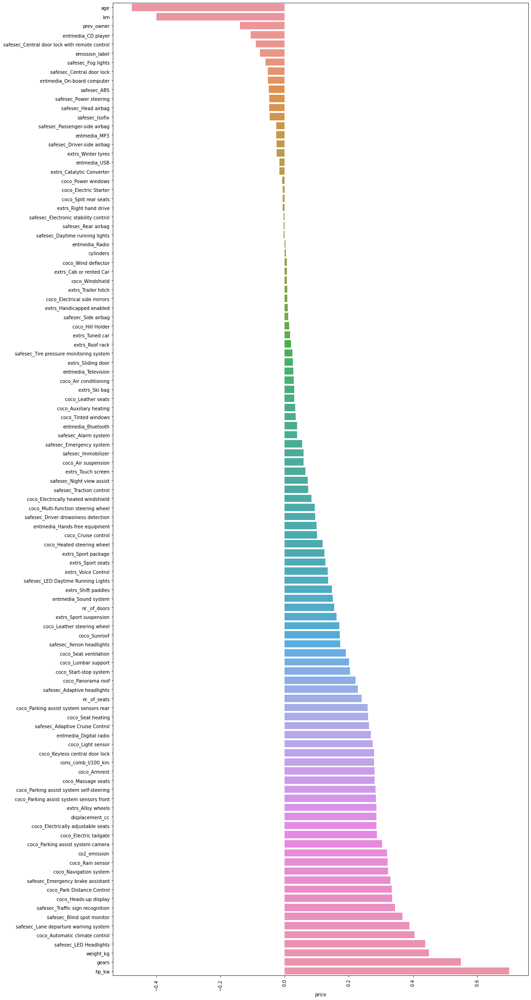

In [80]:
plt.figure(figsize = (16,30))
sns.barplot(x = corr_by_price, y = corr_by_price.index)
plt.xticks(rotation=90)
plt.tight_layout();

# Model Selection

I'll use linear regression model as a base model
And then I will use Ridge, Lasso, Elasticnet, KNeighborsRegressor and Support Vector MAchine Regressor
And then i will use ensemble models, like Randomforest, Gradient Boosting and Extra Trees
Finally I will look at the XGBoost Regresson.
And after evaluating the algorithm, we will select our best model.
Let's start.

## Features and target variable

In [54]:
X = df_final.drop("price", axis=1)
y = df_final['price']
# y = df_final.pop("price")

## Model

## Ridge & Lasso & Elasticnet & KNN with Scaler and Transformer

In [66]:
rmse_test =[]
r2_test =[]
model_names =[]
numerical2= df_final.drop(['price'], axis=1).select_dtypes('number').columns
X= df_final.drop('price', axis=1)
y= df_final['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
s = StandardScaler()
p= PowerTransformer(method='yeo-johnson', standardize=True)
rr = Ridge()
las = Lasso()
el= ElasticNet()
knn = KNeighborsRegressor()
models = [rr,las,el,knn]
for model in models:
    ct = make_column_transformer((s,numerical2),(p,skew_cols.index),remainder='passthrough')  
    pipe = make_pipeline(ct, model)
    pipe.fit(X_train, y_train)
    y_test_pred = pipe.predict(X_test)
    rmse_test.append(round(np.sqrt(mean_squared_error(y_test, y_test_pred)),2))
    r2_test.append(round(r2_score(y_test, y_test_pred),2))
    print (f'model : {model} and  rmse score is : {round(np.sqrt(mean_squared_error(y_test, y_test_pred)),2)}, r2 score is {round(r2_score(y_test, y_test_pred),2)}')
model_names = ['Ridge','Lasso','ElasticNet','KNeighbors']
result_df = pd.DataFrame({'RMSE':rmse_test,'R2_Test':r2_test}, index=model_names)
result_df

model : Ridge() and  rmse score is : 2488.42, r2 score is 0.89
model : Lasso() and  rmse score is : 2488.85, r2 score is 0.89
model : ElasticNet() and  rmse score is : 2797.03, r2 score is 0.86
model : KNeighborsRegressor() and  rmse score is : 2934.05, r2 score is 0.85


,RMSE,R2_Test
Ridge,2488.420,0.890
Lasso,2488.850,0.890
ElasticNet,2797.030,0.860
KNeighbors,2934.050,0.850


In [ ]:
# pd.concat([ls,rs, rcvs, lss, lcvs, es, ecvs], axis = 1)

- By using standard scaler and power transformer for the skewness;
- For linear models we got .92 for the R2 and
- 2307.47 RMSE which are better scores compare to the baseline model.


## Random Forest& Gradient Boosting & Extra Trees & XGBoost

In [67]:
rmse_test =[]
r2_test =[]
model_names =[]



X= df_final.drop('price', axis=1)
y= df_final['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


rf = RandomForestRegressor(random_state=42)
gb = GradientBoostingRegressor(random_state=42)
et= ExtraTreesRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)

models = [rf,gb,et,xgb]

for model in models:
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    rmse_test.append(round(np.sqrt(mean_squared_error(y_test, y_test_pred)),2))
    r2_test.append(round(r2_score(y_test, y_test_pred),2))
    print (f'model : {model} and  rmse score is : {round(np.sqrt(mean_squared_error(y_test, y_test_pred)),2)}, r2 score is {round(r2_score(y_test, y_test_pred),4)}')

model_names = ['RandomForest','GradientBoost','ExtraTree','XGB']
#result_df = pd.DataFrame({'RMSE':rmse_test,'R2_Test':r2_test}, index=model_names)
result_df = pd.DataFrame({'rmse':rmse_test,'R2':r2_test}, index=model_names)
result_df


model : RandomForestRegressor(random_state=42) and  rmse score is : 1624.91, r2 score is 0.9526
model : GradientBoostingRegressor(random_state=42) and  rmse score is : 1970.46, r2 score is 0.9303
model : ExtraTreesRegressor(random_state=42) and  rmse score is : 1703.73, r2 score is 0.9479
model : XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=42,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) and  rmse score is : 1632.15, r2 score is 0.9522


,rmse,R2
RandomForest,1624.910,0.950
GradientBoost,1970.460,0.930
ExtraTree,1703.730,0.950
XGB,1632.150,0.950


Now we are talking.
Random forest, without any tuning got .94 R2 and lowest RMSE.
XGBoost also did a good job without any optimization / tuning


## Best Model with the Hyperparameter Tuning

In [69]:
X= df_final.drop('price', axis=1)
y= df_final['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

rf = RandomForestRegressor(n_estimators= 220, random_state=42 )

rf.fit(X_train, y_train)
y_test_pred = rf.predict(X_test)
print (f' rmse score is : {round(np.sqrt(mean_squared_error(y_test, y_test_pred)),4)}, r2 score is {round(r2_score(y_test, y_test_pred),4)}')

 rmse score is : 1629.5974, r2 score is 0.9523


With hyperparameter tuning we got a lift.
RMSE (from 1984.44 to 1975.8483)
R2 (from .9432 to .9437)

## Feature Importance

In [74]:
importances = rf.feature_importances_
feature_names = [f'feature {i}' for i in range(X.shape[1])]

# what are scores for the features
for i in range(len(rf.feature_importances_)):
    if rf.feature_importances_[i] >0.01:
        print(f'{X_train.columns[i]} : {round(rf.feature_importances_[i],3)}')

print()

# plt.bar([X_train.columns[i] for i in range(len(rf.feature_importances_))], rf.feature_importances_)
# plt.xticks(rotation=90)
# plt.rcParams["figure.figsize"] = (24,12)
# plt.show()

km : 0.063
gears : 0.024
age : 0.19
hp_kw : 0.503
weight_kg : 0.017
cons_comb_l/100_km : 0.011
make_model_audi_a3 : 0.013
make_model_opel_astra : 0.011
make_model_renault_espace : 0.051
gearing_type_manual : 0.013



In [82]:
df_final.head(2)

,price,km,prev_owner,nr._of_doors,nr._of_seats,cylinders,co2_emission,emission_label,gears,age,hp_kw,displacement_cc,weight_kg,cons_comb_l/100_km,coco_air_conditioning,coco_air_suspension,coco_armrest,coco_automatic_climate_control,coco_auxiliary_heating,coco_cruise_control,coco_electric_starter,coco_electric_tailgate,coco_electrical_side_mirrors,coco_electrically_adjustable_seats,coco_electrically_heated_windshield,coco_heads-up_display,coco_heated_steering_wheel,coco_hill_holder,coco_keyless_central_door_lock,coco_leather_seats,coco_leather_steering_wheel,coco_light_sensor,coco_lumbar_support,coco_massage_seats,coco_multi-function_steering_wheel,coco_navigation_system,coco_panorama_roof,coco_park_distance_control,coco_parking_assist_system_camera,coco_parking_assist_system_self-steering,coco_parking_assist_system_sensors_front,coco_parking_assist_system_sensors_rear,coco_power_windows,coco_rain_sensor,coco_seat_heating,coco_seat_ventilation,coco_split_rear_seats,coco_start-stop_system,coco_sunroof,coco_tinted_windows,coco_wind_deflector,coco_windshield,entmedia_bluetooth,entmedia_cd_player,entmedia_digital_radio,entmedia_hands-free_equipment,entmedia_mp3,entmedia_on-board_computer,entmedia_radio,entmedia_sound_system,entmedia_television,entmedia_usb,extrs_alloy_wheels,extrs_cab_or_rented_car,extrs_catalytic_converter,extrs_handicapped_enabled,extrs_right_hand_drive,extrs_roof_rack,extrs_shift_paddles,extrs_ski_bag,extrs_sliding_door,extrs_sport_package,extrs_sport_seats,extrs_sport_suspension,extrs_touch_screen,extrs_trailer_hitch,extrs_tuned_car,extrs_voice_control,extrs_winter_tyres,safesec_abs,safesec_adaptive_cruise_control,safesec_adaptive_headlights,safesec_alarm_system,safesec_blind_spot_monitor,safesec_central_door_lock,safesec_central_door_lock_with_remote_control,safesec_daytime_running_lights,safesec_driver_drowsiness_detection,safesec_driver-side_airbag,safesec_electronic_stability_control,safesec_emergency_brake_assistant,safesec_emergency_system,safesec_fog_lights,safesec_head_airbag,safesec_immobilizer,safesec_isofix,safesec_led_daytime_running_lights,safesec_led_headlights,safesec_lane_departure_warning_system,safesec_night_view_assist,safesec_passenger-side_airbag,safesec_power_steering,safesec_rear_airbag,safesec_side_airbag,safesec_tire_pressure_monitoring_system,safesec_traction_control,safesec_traffic_sign_recognition,safesec_xenon_headlights,make_model_audi_a2,make_model_audi_a3,make_model_opel_astra,make_model_opel_corsa,make_model_opel_insignia,make_model_renault_clio,make_model_renault_duster,make_model_renault_espace,body_type_convertible,body_type_coupe,body_type_off-road,body_type_other,body_type_sedans,body_type_station_wagon,body_type_transporter,body_type_van,vat_yes_deduction/negotiation,inspection_new_yes,body_color_black,body_color_blue,body_color_bronze,body_color_brown,body_color_gold,body_color_gray,body_color_green,body_color_grey,body_color_orange,body_color_red,body_color_silver,body_color_violet,body_color_white,body_color_yellow,paint_type_perl_effect,paint_type_uni/basic,gearing_type_manual,gearing_type_semi-automatic,drive_chain_front,fuel_diesel,fuel_hybrid,fuel_lpg,fuel_others,emission_class_euro_5,emission_class_euro_6,vehicle_condition_used,warranty_month_yes_warranty,upholstery_type_full_leather,upholstery_type_other,upholstery_type_part_leather,upholstery_type_velour,upholstery_type_alcantara,upholstery_color_black,upholstery_color_blue,upholstery_color_brown,upholstery_color_grey,upholstery_color_orange,upholstery_color_other,upholstery_color_red,upholstery_color_white,upholstery_color_yellow
0,15770.000,56013.000,2.000,5.000,5.000,3.000,99.000,4.000,7.000,3.000,66.000,1422.000,1220.000,3.800,1,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,1,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0

In [92]:
df_final.head(2).T

,0,1
price,15770.000,14500.000
km,56013.000,80000.000
prev_owner,2.000,1.000
nr._of_doors,5.000,3.000
nr._of_seats,5.000,4.000
cylinders,3.000,4.000
co2_emission,99.000,129.000
emission_label,4.000,4.000
gears,7.000,7.000
age,3.000,2.000


In [138]:
X= df_final[["km", "age", "hp_kw",
             "make_model_audi_a2", "make_model_audi_a3", 
             "make_model_opel_astra", "make_model_opel_corsa", "make_model_opel_insignia",
             "make_model_renault_clio", "make_model_renault_duster", "make_model_renault_espace",
             "gearing_type_manual", "gearing_type_semi-automatic"]]

In [139]:
y= df_final['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

rf = RandomForestRegressor(n_estimators= 220, random_state=42 )

rf.fit(X_train, y_train)
y_test_pred = rf.predict(X_test)
print (f' rmse score is : {round(np.sqrt(mean_squared_error(y_test, y_test_pred)),4)}, r2 score is {round(r2_score(y_test, y_test_pred),4)}')

 rmse score is : 1980.9295, r2 score is 0.9295


In [130]:
y= df_final['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
rf = RandomForestRegressor()
rf.fit(X_train, y_train)
y_test_pred = rf.predict(X_test)
print (f' rmse score is : {round(np.sqrt(mean_squared_error(y_test, y_test_pred)),4)}, r2 score is {round(r2_score(y_test, y_test_pred),4)}')

 rmse score is : 1981.8686, r2 score is 0.9295


Based on the Random Forest Regressor:
enginesize
curbweight
highway mpg
horse power
have biggest importance scores.
It is important to note that Random Forest Regressor gave importance score bigger than 0 to 16 features.
Model used 16 out of 63 features to get best prediction.
For For deatiled discussion on the Feature Selection-The Most Common Methods to Know


We have developed model to predict car price problem.

First, we made the detailed exploratory analysis.

We have decided which metric to use.

We analyzed both target and features in detail.

We transform categorical variables into numeric so we can use them in the model.

We transform numerical variables to reduce skewness and get close to normal distribution.

We use pipeline to avoid data leakage.

We looked at the results of the each model and selected the best one for the problem in hand.

We made hyperparameter tuning of the best model see the improvement

We looked at the feature importance.

After this point it is up to you to develop and improve the models. Enjoy 🤘
By the way, when you like the topic, you can show it by supporting 👍
Feel free to leave a comment.
All the best 🤘

In [132]:
X.describe()

,km,age,hp_kw,make_model_audi_a2,make_model_audi_a3,make_model_opel_astra,make_model_opel_corsa,make_model_opel_insignia,make_model_renault_clio,make_model_renault_duster,make_model_renault_espace,gearing_type_manual,gearing_type_semi-automatic
count,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000,14409.000
mean,32091.129,1.394,88.611,0.000,0.195,0.161,0.142,0.167,0.104,0.002,0.061,0.508,0.032
std,36777.326,1.113,26.541,0.008,0.396,0.368,0.349,0.373,0.305,0.049,0.240,0.500,0.177
min,0.000,0.000,40.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,3000.000,0.000,66.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,20490.000,1.000,85.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
75%,46000.000,2.000,103.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
max,317000.000,3.000,294.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000


In [133]:
X.columns

Index(['km', 'age', 'hp_kw', 'make_model_audi_a2', 'make_model_audi_a3',
       'make_model_opel_astra', 'make_model_opel_corsa',
       'make_model_opel_insignia', 'make_model_renault_clio',
       'make_model_renault_duster', 'make_model_renault_espace',
       'gearing_type_manual', 'gearing_type_semi-automatic'],
      dtype='object')

In [131]:
## Final Model and Model Deployment
import pickle
final_model = RandomForestRegressor().fit(X, y)
pickle.dump(final_model, open("final_model_autoscout", 'wb'))

In [ ]:
 mylist = [[hp_kw, km, age, make_model_Audi_A1 ,make_model_Audi_A3, make_model_Opel_Astra, make_model_Opel_Corsa, make_model_Opel_Insignia, make_model_Renault_Clio, make_model_Renault_Duster, make_model_Renault_Espace, gearing_type_Automatic, gearing_type_Manual, gearing_type_Semi_Automatic]]
        data = pd.DataFrame(mylist, columns= ["hp_kw", "km", "age", "make_model_Audi_A1" ,"make_model_Audi_A3", "make_model_Opel_Astra", "make_model_Opel_Corsa", "make_model_Opel_Insignia", "make_model_Renault_Clio", "make_model_Renault_Duster", "make_model_Renault_Espace", "gearing_type_Automatic", "gearing_type_Manual", "gearing_type_Semi_Automatic"])

In [ ]:
my_dict = {"sepal_length": [4.5, 5.8, 7.5],
           "sepal_width": [2.2, 3, 4.2],
           "petal_length": [1.3, 4.3, 6.5],
           "petal_width": [0.2, 1.3, 2.3]
          }
sample = pd.DataFrame(my_dict)
sample


In [ ]:
scaler_iris = pickle.load(open("scaler_iris", "rb"))


In [ ]:
sample_scaled = scaler_iris.transform(sample)
sample_scaled


In [ ]:
final_model = pickle.load(open("final_model_iris", "rb")


In [ ]:
predictions = final_model.predict(sample_scaled)
predictions_proba = final_model.predict_proba(sample_scaled)


In [ ]:
sample["pred"] = predictions
sample["pred_proba_setosa"] = predictions_proba[:,0]
sample["pred_proba_versicolor"] = predictions_proba[:,1]
sample["pred_proba_virginica"] = predictions_proba[:,2]
sample
